**Tabla de contenido**

- [Introducción](#Introducción)
- [Lib](#Lib)
- [Lectura de datos](#Lectura-de-datos)
- [Integridad de datos](#Integridad-de-datos)
- [Estad descriptivas](#Estad-descriptivas)
    - [Ventas por fechas](#Ventas-por-fechas)
    - [Ventas regionales](#Ventas-regionales)
        - [Ventas totales por ciudad](#Ventas-totales-por-ciudad)
        - [Tiendas con mayores ventas por ciudad](#Tiendas-con-mayores-ventas-por-ciudad)
        - [Impacto del combustible en las ventas max](#Impacto-del-combustible-en-las-ventas-max)
        - [Impacto de la temperatura en las ventas max](#Impacto-de-la-temperatura-en-las-ventas-max)
        - [Impacto de la tasa de desempleo en las ventas max](#Impacto-de-la-tasa-de-desempleo-en-las-ventas-max)
        - [Ventas promedio y variabilidad](#Ventas-promedio-y-variabilidad)
        - [Precio promedio del combustible y variabilidad](#Precio-promedio-del-combustible-y-variabilidad)
        - [CPI promedio y variabilidad](#CPI-promedio-y-variabilidad)
        - [Tasa de desempleo promedio y variabilidad](#Tasa-de-desempleo-promedio-y-variabilidad)
    - [Comportamiento general de las variables](#Comportamiento-general-de-las-variables)
        - [Skewness](#Skewness)
        - [Box plot](#Box-plot)
        - [Correlaciones](#Correlaciones)
- [Entrenamiento de modelo simple](#Entrenamiento-de-modelo-simple)
- [Resultados y conclusiones](#Resultados-y-conclusiones)

# Introducción

En este cuaderno realizamos una exploración de datos con el fin de dar respuesta a las siguientes preguntas:

1. ¿Qué características permiten realizar predicciones con una mayor probabilidad de éxito?
2. ¿Existen patrones que puedan ayudar a predecir los ingresos futuros de cada una de las tiendas?
3. ¿Es viable implementar un modelo de regresión lineal para realizar estas predicciones?

¡Sin más preámbulos, comencemos a explorar los datos!

# Lib

Para garantizar el correcto funcionamiento de este cuaderno, se requieren las siguientes librerías:

- **Python:** Versión 3.12.3
- **Pandas:** Versión 2.2.3
- **Matplotlib:** Versión 3.10.0
- **NumPy:** Versión 1.26.0
- **Seaborn:** Versión 0.13.2
- **Scikit-learn:** Versión 1.6.1
- **Statsmodels:** Versión 0.14.4

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.colors as mcolors
import os
from pathlib import Path
import seaborn as sns

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from statsmodels.formula import api

# Lectura de datos

Los datos fueron leídos desde dos archivos CSV. El primer archivo, **WalmartSalesClean.csv**, fue exportado desde el cuaderno LDV-APV y utiliza el carácter **","** como delimitador. El segundo archivo, **TFM_Table_Store.csv**, fue exportado desde la tabla Store de la base de datos TFM en SQL Server 2022, y emplea el carácter **";"** como delimitador.

**Para leer correctamente este archivo, es necesario proporcionar la ruta donde se encuentra almacenado.**

In [2]:
os.chdir('D:\\6. NEXER\\master\\Solucion TFM\\2. Datos en CSV')
WalmartSales = pd.read_csv('WalmartSalesClean.csv', delimiter=',')
Stores = pd.read_csv('TFM_Table_Store.csv', delimiter=';')

Veamos los primeros 5 registros de cada dataset.

In [3]:
Stores.head()

,Store_ID,City,Open_Date,Zip_Code,Phone,Email
0,1,San Antonio,2003-07-24 21:45:30,78015,2136875667,store1@retail.com
1,2,San Antonio,2005-10-27 07:01:09,78201,2135167236,store2@retail.com
2,3,San Antonio,2007-02-01 16:59:13,78112,2123501192,store3@walmart.com
3,4,Houston,2004-07-17 00:28:08,77001,3129778178,store4@walmart.com
4,5,Houston,2009-04-23 01:08:37,77002,7136191883,store5@store.com


In [4]:
WalmartSales.head()

,Date,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Holiday_Events
0,2010-02-12,1,164195744,1,38.51,2.548,211.242176,8.106,1
1,2010-02-19,1,161196816,0,39.93,2.514,211.289139,8.106,0
2,2010-02-26,1,140972752,0,46.63,2.561,211.319642,8.106,0
3,2010-03-05,1,155480672,0,46.50,2.625,211.350144,8.106,0
4,2010-03-12,1,143954160,0,57.79,2.667,211.380646,8.106,0


# Integridad de datos

Este proceso consiste en realizar las siguientes acciones:

- Identificar y manejar registros duplicados (si los hubiera).
- Gestionar datos faltantes (en caso de que existan).
- Verificar y asegurar que los tipos de datos sean los correctos.

¡Procedamos a analizar lo que contienen nuestros datos!

In [5]:
# Función que verifica la integridad de los datos.
def Data_Verification(df):
    rows, cols = df.shape
    missing_values = df.isna().sum().sum()
    duplicates = df.duplicated().sum()
    
    print(f"Information: Hay {rows:,.0f} registros y {cols:,.0f} columnas.")
    print(f"Missing values = {missing_values}, Duplicates = {duplicates}.\n")

Data_Verification(WalmartSales)

Information: Hay 5,763 registros y 9 columnas.
Missing values = 0, Duplicates = 0.



In [6]:
Data_Verification(Stores)

Information: Hay 45 registros y 6 columnas.
Missing values = 0, Duplicates = 0.



In [7]:
WalmartSales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5763 entries, 0 to 5762
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            5763 non-null   object 
 1   Store           5763 non-null   int64  
 2   Weekly_Sales    5763 non-null   int64  
 3   Holiday_Flag    5763 non-null   int64  
 4   Temperature     5763 non-null   float64
 5   Fuel_Price      5763 non-null   float64
 6   CPI             5763 non-null   float64
 7   Unemployment    5763 non-null   float64
 8   Holiday_Events  5763 non-null   int64  
dtypes: float64(4), int64(4), object(1)
memory usage: 405.3+ KB


**¡Esto es perfecto!** No hay registros faltantes (missing values) ni registros duplicados.

Sin embargo, en el dataframe **"WalmartSales"**, la columna **Date** no está en formato datetime. Vamos a corregir esto.

In [8]:
WalmartSales['Date'] = pd.to_datetime(WalmartSales['Date'],format = '%Y-%m-%d')
WalmartSales.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5763 entries, 0 to 5762
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            5763 non-null   datetime64[ns]
 1   Store           5763 non-null   int64         
 2   Weekly_Sales    5763 non-null   int64         
 3   Holiday_Flag    5763 non-null   int64         
 4   Temperature     5763 non-null   float64       
 5   Fuel_Price      5763 non-null   float64       
 6   CPI             5763 non-null   float64       
 7   Unemployment    5763 non-null   float64       
 8   Holiday_Events  5763 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(4)
memory usage: 405.3 KB


Listo, con esto podemos continuar a calcular las estadísticas descriptivas.

# Estad descriptivas

Los estadísticos descriptivos seleccionados para el análisis son los siguientes:

- **Promedio (mean)**.
- **Medidas de posición:** Valores máximos y mínimos.
- **Desviación estándar**.
- **Coeficiente de variación (Cv)**

El objetivo de emplear estos estadísticos es analizar los datos en los siguientes aspectos:

1. Analizar las ventas por año, mes y día.
2. Analizar las ventas totales por ciudad y su coeficiente de variación.
3. Identificar las tiendas con mayores ventas en cada ciudad.
4. Examinar las temperaturas máximas, mínimas y promedio por ciudad.
5. Evaluar los precios del combustible por ciudad (máximo, mínimo y promedio).
6. Estudiar los índices de precios al consumidor, segmentados por ciudad o tienda.
7. Revisar la tasa de desempleo en cada ciudad.

##  Ventas por fechas

Analicemos las ventas por meses, trimestres y años.  Para ello, es necesario descomponer la fecha en día, mes, año, día de la semana y trimestre.

In [9]:
WalmartSales['Day'] = WalmartSales['Date'].dt.day
WalmartSales['Weekday'] = WalmartSales['Date'].dt.weekday
WalmartSales['Month'] = WalmartSales['Date'].dt.month
WalmartSales['Year'] = WalmartSales['Date'].dt.year
WalmartSales['week'] = WalmartSales['Date'].dt.isocalendar().week
WalmartSales['quarter'] = WalmartSales['Date'].dt.quarter 
WalmartSales = WalmartSales.drop('Date', axis=1)

Ahora, veamos cómo han sido las ventas.

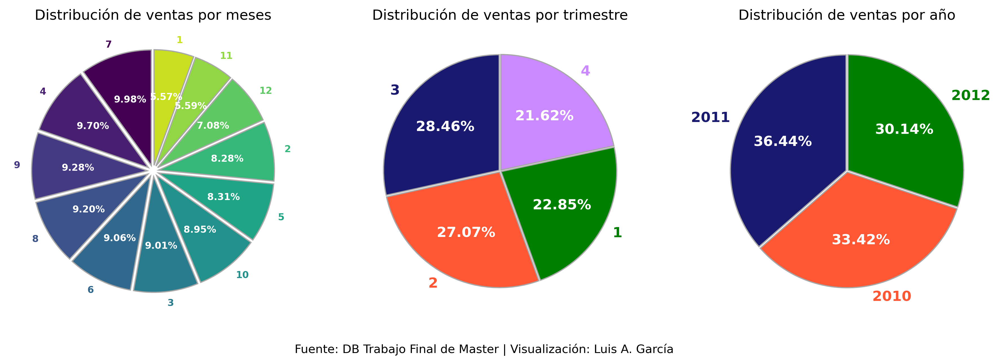

In [10]:
fig = plt.figure(figsize=(15,5),dpi=300)
plt.subplot(1, 3, 1)
num_sections = WalmartSales['Month'].nunique()  
explode_values = [0.05] * num_sections
cmap = sns.color_palette("viridis", as_cmap=True)
colors = [cmap(i / num_sections) for i in range(num_sections)]

# Gráfico de pastel para los meses
wedges, texts, autotexts = plt.pie(WalmartSales['Month'].value_counts().values,
                                   labels=WalmartSales['Month'].value_counts().index,
                                   autopct='%1.2f%%',
                                   startangle=90,
                                   colors=colors,
                                   labeldistance=1.1,
                                   wedgeprops={'edgecolor': '#a7a7a7'},
                                   textprops={'fontsize': 8, 'color': 'white', 'fontweight': 'bold'},  
                                   explode=explode_values)
for i, text in enumerate(texts):
    text.set_color(colors[i])
plt.title('Distribución de ventas por meses')

plt.subplot(1, 3, 2)
colores = ['#191970', '#FF5733', 'green', '#ca89ff']
wedges, texts, autotexts = plt.pie(WalmartSales['quarter'].value_counts().values, 
                                   labels=WalmartSales['quarter'].value_counts().index,
                                   autopct='%1.2f%%', startangle=90, colors=colores,
                                   labeldistance=1.1, wedgeprops={'edgecolor': '#a7a7a7'}, 
                                   textprops={'fontsize': 12, 'color': 'white', 'fontweight': 'bold'},
                                   explode=[0.01, 0.01, 0.01, 0.01])  

# Cambiar colores específicos de los textos
texts[0].set_color('#191970')  
texts[1].set_color('#FF5733')  
texts[2].set_color('green')
texts[3].set_color('#ca89ff')
plt.title('Distribución de ventas por trimestre')

plt.subplot(1, 3, 3)
colores = ['#191970', '#FF5733','green']
wedges, texts, autotexts = plt.pie(WalmartSales['Year'].value_counts().values, 
                                   labels=WalmartSales['Year'].value_counts().index,
                                   autopct='%1.2f%%', startangle=90, colors=colores,
                                   labeldistance=1.1, wedgeprops={'edgecolor': '#a7a7a7'}, 
                                   textprops={'fontsize': 12, 'color': 'white', 'fontweight': 'bold'},
                                   explode=[0.01, 0.01, 0.01])

# Cambiar colores específicos de los textos
texts[0].set_color('#191970')  
texts[1].set_color('#FF5733')  
texts[2].set_color('green')
plt.title('Distribución de ventas por año')
# Pie de página
fig.subplots_adjust(top=0.8)
fig.text(0.5, 0.025, 
         "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García", 
         fontsize=10, ha="center", va="baseline")
plt.grid()

En la figura se presentan tres gráficos que muestran la distribución de las ventas en tres niveles: mensual, trimestral y anual, organizados según la frecuencia de aparición. A partir de estos gráficos, podemos destacar lo siguiente:

- **Distribución de ventas por meses:** Los meses con los porcentajes más altos en ventas son julio (9.98%), abril (9.70%), septiembre (9.28%), agosto (9.20%), junio (9.06%) y marzo (9.01%). Por otro lado, los meses con porcentajes intermedios, comprendidos entre el 8% y el 8.95%, son octubre (8.95%), mayo (8.31%) y febrero (8.28%). Finalmente, los meses con los porcentajes más bajos en ventas son diciembre (7.08%), noviembre (5.59%) y enero (5.57%).
- **Distribución de ventas por trimestres:** Los trimestres con los mayores porcentajes de ventas son el 2 y el 3, los cuales corresponden a las estaciones de primavera, verano y otoño.
- **Distribuciones por año:** Los años con el mayor número de registros de ventas son 2011 y 2010.

## Ventas regionales

Para el análisis de ventas regionales, se calculó el total de ventas por ciudad siguiendo los siguientes pasos:

- Se creó una columna denominada **'City'** con valores None en el dataframe WalmartSales.
- Se extrae el ID de cada tienda en cada ciudad.
- Se completó la columna 'City' con los nombres correspondientes a las ciudades según su Store_ID respectivo.
- Se agrupa por ciudad y se calculan los estadísticos.

In [11]:
Citys = Stores['City'].unique()
citys_store = {City: [] for City in Citys}
WalmartSales['City'] = None

for StoreID in Citys:
    ID = Stores[Stores['City'] == StoreID]['Store_ID'].to_list()
    WalmartSales.loc[WalmartSales['Store'].isin(ID), 'City'] = StoreID
    citys_store[StoreID].append(ID)


# veamos en que ciudad se vende más
TotalSalesbyCity = WalmartSales.groupby(by=['City']).agg(
    TotalSales = ('Weekly_Sales','sum'),
    MeanSales = ('Weekly_Sales','mean'),
    CountSales = ('Weekly_Sales','count'),
    StdSales = ('Weekly_Sales','std')
).assign(
    cv = lambda x: ((x['StdSales']/x['MeanSales'])*100)
).reset_index()
TotalSalesbyCity = TotalSalesbyCity.sort_values(by='TotalSales', ascending=False)

### Estadísticos de las variables por tienda y ciudad.

Para analizar el comportamiento de las variables teniendo en cuenta las tiendas y las ciudades, se creó la función **comportamiento_variable_ciudad_tienda**, que recibe un dataframe y las variables de interés. Esta función agrupa los datos por ciudad y tienda, y luego calcula los estadísticos correspondientes.

In [12]:
def comportamiento_variable_ciudad_tienda(df,var):
    if var == 'Weekly_Sales':
        group = df.groupby(by = ['City','Store']).agg(
            TotalValue  = (var,'sum'),
            MeanValue  = (var,'mean'),
            CountValue  = (var,'count'),
            StdValue  = (var,'std')
            ).assign(cv = lambda x: ((x['StdValue']/x['MeanValue'])*100)).reset_index()
    else:
        group =df.groupby(by = ['City','Store']).agg(
            MinValue = (var,'min'),
            MaxValue = (var,'max'),
            MeanValue = (var,'mean'),
            CountValue = (var,'count'),
            StdValue = (var,'std')
            ).assign(cv = lambda x: ((x['StdValue']/x['MeanValue'])*100)).reset_index()
    return group

Con la función definida, obtengamos los grupos para cada variable y visualicemos una de ellas.

In [13]:
# obtengamos las agrupaciones
col_interest = ['Weekly_Sales','Temperature','Fuel_Price','CPI','Unemployment']
grupos = {}
for i in col_interest:
    name = i +'groupby'
    grupos[name] = comportamiento_variable_ciudad_tienda(WalmartSales,i)
print(grupos.keys())

dict_keys(['Weekly_Salesgroupby', 'Temperaturegroupby', 'Fuel_Pricegroupby', 'CPIgroupby', 'Unemploymentgroupby'])


In [14]:
grupos['Unemploymentgroupby'].head(10)

,City,Store,MinValue,MaxValue,MeanValue,CountValue,StdValue,cv
0,Chicago,22,7.503,8.572,8.069354,130,0.371124,4.599181
1,Chicago,31,6.170,8.324,7.598890,127,0.616432,8.112133
2,Chicago,36,6.228,8.554,7.819992,127,0.717626,9.176812
3,Chicago,38,10.199,14.313,13.103876,129,1.228818,9.377513
4,Houston,4,3.879,8.623,5.924669,133,1.394241,23.532804
5,Houston,5,5.422,6.768,6.286736,121,0.393651,6.261611
6,Houston,21,6.170,8.324,7.614181,127,0.632140,8.302135
7,Houston,25,6.961,8.187,7.373039,129,0.300878,4.080790
8,Houston,33,6.895,10.115,8.518225,129,0.961390,11.286268
9,Houston,35,8.512,9.262,8.793331,124,0.187552,2.132889


### Ventas máximas semanales por ciudad y tienda

Ahora calculemos los registros con ventas máximas semanales (Weekly_Sales) por cada ciudad y tienda en el DataFrame WalmartSales.

In [15]:
MaxSales = WalmartSales.loc[WalmartSales.groupby(by=['City', 'Store'])['Weekly_Sales'].idxmax()]

**Con esto, hemos completado los cálculos de los estadísticos. Ahora, pasemos a graficar estos resultados y realizar su análisis.**

### Análisis descriptivo y gráficas de ventas totales y variables asociadas

A partir de las estadísticas calculadas de total de ventas por ciudad (**TotalSalesbyCity**) y ventas máximas por ciudad (**MaxSales**), se realizarán gráficos y análisis descriptivos para:

1. **Ventas totales por ciudad.**
2. **Identificación de las tiendas con mayores ventas por ciudad.**
3. **Relación entre ventas máximas y precio del combustible por tienda y ciudad.**
4. **Impacto de la temperatura en las ventas récord por tienda y ciudad.**
5. **Relación entre ventas récord y tasa de desempleo por tienda y ciudad.**

Antes de comenzar, definamos algunas funciones que facilitarán la creación de las gráficas. Estas son:

1. **circularBarPlot:** Devuelve un diccionario que asigna un color a cada valor de x. Por ejemplo, si x contiene nombres de ciudades, a cada ciudad se le asignará un color específico.
2. **barplot:** Recibe los colores generados por la función circularBarPlot y dibuja un gráfico de barras horizontal. En este gráfico, las barras representan los valores de x, y se colorean de acuerdo con los colores asignados por circularBarPlot para cada valor de x. 
3. **lollipop_plot:** Realiza el mismo procedimiento que el gráfico de barras (barplot), pero en lugar de barras, utiliza líneas verticales conectadas a puntos, creando un diagrama de tipo "lollipop".
4. **lollipop_plotByStoreInCity:** A diferencia de las anteriores funciones, esta función no recibe el diccionario de colores; en su lugar, recibe un único color y crea un diagrama tipo lollipop.

In [16]:
# 1.
def circularBarPlot(x, y, z, title, TextBar, caption, area):
    """
    Crea un gráfico de barras circular con colores personalizados y un mapa de colores.
    
    Parámetros:
        x (pd.Series): Etiquetas de las barras.
        y (pd.Series): Valores para las alturas de las barras.
        z (pd.Series): Valores para definir los colores de las barras.
        title (str): Título del gráfico.
        TextBar (str): Texto para la leyenda de la barra de colores.
        caption (str): Pie de página del gráfico.
        area (tuple): Área de la subgráfica (left, bottom, width, height).
        
    Retorna:
        dict: Diccionario con las etiquetas (x) y los colores asociados en formato hexadecimal.
    """
    
    # Verificar que las entradas sean pandas Series
    if not isinstance(x, pd.Series) or not isinstance(y, pd.Series) or not isinstance(z, pd.Series):
        raise TypeError("Los argumentos x, y, z deben ser pandas Series.")
    
    # Generar los ángulos para las barras
    ANGLES = np.linspace(0, 2 * np.pi, len(x), endpoint=False)
    
    # Crear colormap y normalizador discreto
    bounds = np.unique(np.sort(np.floor(z).astype(np.int64)))
    cmap = plt.colormaps['tab20b']
    colores = [mcolors.to_hex(c) for c in cmap(np.linspace(0, 1, len(bounds)))]

    cmap = mcolors.ListedColormap(colores)
    norm = mcolors.BoundaryNorm(bounds, ncolors=len(colores), clip=True)
    BAR_COLORS = cmap(norm(z))
    
    # Convertir colores a formato hexadecimal
    BAR_COLORS_HEX = [mcolors.to_hex(color) for color in BAR_COLORS]

    # Configuración del gráfico
    ax = fig.add_axes(area, projection='polar')
    fig.patch.set_facecolor("white")
    ax.set_facecolor("white")
    
    # Rotación de las barras
    theta_offset = 1.2 * np.pi / 2
    ROTATED_ANGLES = (ANGLES + theta_offset) % (2 * np.pi)
    
    # Dibujar barras
    bars = ax.bar(ROTATED_ANGLES, y, color=BAR_COLORS, alpha=0.9, width=0.52, zorder=10)
    
    # Añadir líneas punteadas
    ax.vlines(ROTATED_ANGLES, 50, y.max() * 1.1, color="grey", ls=(0, (2, 6)), zorder=1)
    
    # Ajuste de las etiquetas del eje x
    x_wrapped = x.str.replace("\n", " ").str.wrap(5, break_long_words=False)
    ax.set_xticks(ROTATED_ANGLES)
    ax.set_xticklabels(x_wrapped, size=12)
    
    # Quitar guías innecesarias
    ax.xaxis.grid(True)
    ax.set_yticklabels([])
    ax.spines["start"].set_color("none")
    ax.spines["polar"].set_color("none")

    # Añadir etiquetas de los valores en las barras
    for bar, angle, label in zip(bars, ROTATED_ANGLES, y):
        rotation = np.rad2deg(angle)
        alignment = "right" if np.pi / 2 <= angle < 3 * np.pi / 2 else "left"
        if alignment == "right":
            rotation += 180

        label_position = bar.get_height() * 0.5
        ax.text(
            x=angle, y=label_position, s=f"{label:.3f}", ha=alignment, va="center",
            rotation=rotation, rotation_mode="anchor", color="black", fontsize=10, zorder=20
        )
        
    # Crear barra de colores
    fig.subplots_adjust(bottom=0.175)
    cbaxes = inset_axes(
        ax, width="80%", height="20%", loc="lower center",
        bbox_to_anchor=(0.1, -0.2, 0.8, 0.1), bbox_transform=ax.transAxes
    )
    cb = fig.colorbar(
        ScalarMappable(norm=norm, cmap=cmap),
        cax=cbaxes, orientation="horizontal"
    )
    cb.outline.set_visible(False)
    cb.ax.xaxis.set_tick_params(size=0)
    cb.ax.set_xticks(bounds)
    cb.set_label(TextBar, size=12, labelpad=-40)
    
    # Pie de página y título
    fig.subplots_adjust(top=0.8)
    fig.text(0.1, 0.93, title, fontsize=16, weight="bold", ha="left", va="baseline")
    fig.text(0.5, 0.025, caption, fontsize=10, ha="center", va="baseline")
    
    # Diccionario de colores
    color_dic = dict(zip(x, BAR_COLORS_HEX))
    
    return color_dic

In [17]:
# 2.
#nameax  es el nombre que se visualizara en el eje x
# x debe ser la misma variable usada en circularBarPlot
def barplot(x, y, colores, area, nameax):
    """
    Crea un gráfico de barras horizontales con etiquetas de porcentaje.

    Parámetros:
        x (pd.Series): Etiquetas para las barras.
        y (pd.Series): Valores de las barras.
        colores (list): Lista de colores asociados a cada valor en x.
        area (tuple): Área de la subgráfica (left, bottom, width, height).
        nameax (str): Nombre para el eje X del gráfico.
        
    Retorna:
        None: Modifica el gráfico en el objeto `fig` directamente.
    """
    
    # Convertir a valores para asegurar que son arrays de NumPy
    x = x.values
    y = y.values
    
    # Crear el gráfico de barras horizontales
    ax = fig.add_axes(area)
    colores = [colores[i] for i in x]  # Asignar color a cada barra según x
    bars = ax.barh(x, y, color=colores)
    
    # Añadir etiquetas de porcentaje a la derecha de las barras
    for bar, porcentaje in zip(bars, y):
        max_width = max([b.get_width() for b in bars])  # Obtener el ancho máximo de las barras
        texto_x = bar.get_width() + (max_width * 0.01)  # Colocar texto al 1% del ancho máximo
        ax.text(texto_x, bar.get_y() + bar.get_height()/2, 
                f'{porcentaje:.2f}', va='center', ha='left')
    
    # Mejorar la apariencia del gráfico
    ax.set_xlabel(nameax, fontsize=12)
    ax.set_xlim(0, y.max())  # Ajustar los límites del eje x
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Configuración de las etiquetas del eje y
    ax.set_yticks(range(len(y)))
    ax.set_yticklabels(x, fontsize=12)

In [18]:
# 3.
#nameax  es el nombre que se visualizara en el eje x
# x debe ser la misma variable usada en circularBarPlot
def lollipop_plot(x, y, colores, area, nameax):
    """
    Crea un gráfico de tipo "Lollipop", con líneas verticales y puntos en la parte superior.

    Parámetros:
        x (pd.Series): Etiquetas para cada punto.
        y (pd.Series): Valores para las posiciones de los puntos.
        colores (list): Lista de colores asociados a cada valor en x.
        area (tuple): Área de la subgráfica (left, bottom, width, height).
        nameax (str): Nombre para el eje X del gráfico.
        
    Retorna:
        None: Modifica el gráfico en el objeto `fig` directamente.
    """
    
    # Convertir a valores para asegurar que son arrays de NumPy
    x = x.values
    y = y.values

    # Crear el gráfico
    ax = fig.add_axes(area)

    # Colores asociados a cada valor
    colores = [colores[i] for i in x]

    # Dibujar las líneas verticales
    for i, (xi, yi, color) in enumerate(zip(x, y, colores)):
        ax.plot([yi, 0], [i, i], color=color, lw=2, alpha=0.8)

    # Dibujar los puntos en las líneas
    ax.scatter(y, range(len(y)), color=colores, s=100, zorder=2)

    # Añadir el texto al final de cada línea
    max_y = max(y)
    for yi, i in zip(y, range(len(y))):
        texto_x = yi + (max_y * 0.05)  # Colocar el texto a 5% del valor máximo
        ax.text(texto_x, i, f'{yi:.2f}', va='center', ha='left')

    # Configuración del gráfico
    ax.set_xlabel(nameax, fontsize=12)
    ax.set_xlim(0, y.max() + 10)  # Ajustar los límites del eje x
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Configuración de las etiquetas del eje y
    ax.set_yticks(range(len(y)))
    ax.set_yticklabels(x, fontsize=12)

In [19]:
# 4.
# color es un único color. por ejemplo: color = '#de9ed6'
#nameax  es el nombre que se visualizara en el eje x
def lollipop_plotByStoreInCity(x, y, color, area, nameax, nameay, title, city):
    """
    Crea un gráfico de tipo "Lollipop" con líneas verticales y puntos para representar datos de tiendas en una ciudad.

    Parámetros:
        x (pd.Series): Etiquetas de las tiendas (por ejemplo, nombres de las tiendas).
        y (pd.Series): Valores que representan alguna métrica (por ejemplo, ventas o visitas).
        color (str): Color para las líneas y los puntos del gráfico.
        area (tuple): Área de la subgráfica (left, bottom, width, height).
        nameax (str): Nombre para el eje X del gráfico.
        nameay (str): Nombre para el eje Y del gráfico.
        title (str): Título del gráfico.
        city (str): Nombre de la ciudad (aunque no se utiliza en el gráfico, podría ser útil para el título o en la descripción).
        
    Retorna:
        None: Modifica el gráfico en el objeto `fig` directamente.
    """
    
    # Convertir a valores para asegurar que son arrays de NumPy
    x = x.values
    y = y.values

    # Crear el gráfico
    ax = fig.add_axes(area)

    # Dibujar las líneas verticales
    for i, (xi, yi) in enumerate(zip(x, y)):
        ax.plot([yi, 0], [i, i], color=color, lw=2, alpha=0.8)

    # Dibujar los puntos en las líneas
    ax.scatter(y, range(len(y)), color=color, s=100, zorder=2)

    # Añadir el texto al final de cada línea
    max_y = max(y)
    for yi, i in zip(y, range(len(y))):
        texto_x = yi + (max_y * 0.05)  # Colocar el texto a 5% del valor máximo
        ax.text(texto_x, i, f'{yi:.2f}', va='center', ha='left')

    # Configuración del gráfico
    ax.set_title(title, fontsize=14, weight='bold')
    ax.set_xlabel(nameax, fontsize=12)
    ax.set_ylabel(nameay, fontsize=12)
    ax.set_xlim(0, y.max() + 10)  # Ajuste de los límites en el eje x
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Configuración de las etiquetas del eje y
    ax.set_yticks(range(len(y)))
    ax.set_yticklabels(x, fontsize=12)

In [20]:
def get_label_rotation(angle, offset):
    """
    Calcula la rotación y alineación para una etiqueta basada en su ángulo y un desplazamiento.

    Parámetros:
        angle (float): Ángulo en radianes para la etiqueta.
        offset (float): Desplazamiento adicional en radianes para la rotación.

    Retorna:
        tuple: Un par con el ángulo de rotación en grados y la alineación del texto ('left' o 'right').
    """
    # Convertir el ángulo a grados
    rotation = np.rad2deg(angle + offset)
    
    # Determinar la alineación del texto dependiendo del ángulo
    if angle <= np.pi:
        alignment = "right"
        rotation += 180
    else:
        alignment = "left"
    
    return rotation, alignment

def add_labels(angles, values, labels, offset, ax, label_position, decimals):
    """
    Añade etiquetas a un gráfico polar en las posiciones deseadas.

    Parámetros:
        angles (array-like): Ángulos para las etiquetas en radianes.
        values (array-like): Valores asociados a las etiquetas.
        labels (array-like): Etiquetas a mostrar.
        offset (float): Desplazamiento adicional para la rotación de las etiquetas.
        ax (matplotlib.axes.Axes): El objeto de ejes donde se dibujan las etiquetas.
        label_position (str): Posición de la etiqueta ('center', 'end', 'start', 'inner').
        decimals (int): Número de decimales a mostrar en las etiquetas.

    Retorna:
        None: Modifica el gráfico directamente.
    """
    padding = 0.4  # Espacio entre etiqueta y fin de barra
    max_value = max(abs(v) for v in values)  # Tamaño de la barra más grande

    for angle, value, label in zip(angles, values, labels):
        # Obtener la rotación y alineación del texto
        rotation, alignment = get_label_rotation(angle, offset)

        # Calcular posición de la etiqueta según `label_position`
        if label_position == "center":
            y = value / 2
        elif label_position == "end":
            percentage_of_max = abs(value) / max_value
            separation_factor = (1 - percentage_of_max) * 0.25
            y = value + padding + separation_factor * max_value if value >= 0 else value - padding - separation_factor * max_value
        elif label_position == "start":
            y = -padding + 0.6
        elif label_position == "inner":
            y = value * 0.8
        else:
            raise ValueError("Invalid label position. Use 'center', 'end', 'start', or 'inner'.")

        # Agregar la etiqueta en la posición calculada
        ax.text(
            x=angle, 
            y=y, 
            s=f"{label:.{decimals}f}", 
            ha=alignment, 
            va="center", 
            rotation=rotation, 
            rotation_mode="anchor",
            fontweight="bold"
        )
# definiendo función que grafica los grupos
"""
VALUES: Serie de datos que se quiere graficar. ejemplo  MaxSales["Fuel_Price"]
LABELS: Etiques o clases a las que corresponde los datos. ejemplo MaxSales["Store"]
GROUP: Grupo al que pertencen las clases. ejemplo MaxSales["City"]
PAD: Espacio que abrá entre grupos de barras. Ejemplo PAD =3
description: descripción de variable que se grafica. ejemplo: 
    "Precio del\n combustible\npor ciudad \ny\n tienda"
"""
def circularBarPlotWithGroups(VALUES, LABELS, GROUP, area, description, labelcenterbar, PAD, colors=None):
    """
    Dibuja un gráfico circular de barras agrupadas en un gráfico polar, con etiquetas en varias posiciones y líneas de referencia.

    Parámetros:
        VALUES (array-like): Valores de las barras para cada ángulo.
        LABELS (array-like): Etiquetas asociadas a cada barra.
        GROUP (array-like): Grupo al que pertenece cada barra.
        area (tuple): Área del gráfico en la forma (x, y, width, height) para la colocación del gráfico polar.
        description (str): Texto a mostrar en el centro del gráfico.
        labelcenterbar (array-like): Etiquetas adicionales dentro de las barras.
        PAD (int): Espacio entre grupos de barras.
        colors (dict, opcional): Diccionario de colores por grupo, por defecto se asignan colores automáticos.

    Retorna:
        None: Modifica el gráfico directamente.
    """
    VALUES = VALUES.values 
    LABELS = LABELS.values
    GROUP = GROUP.values
    OFFSET = np.pi / 2
    
    # Calcular tamaños de los grupos y ángulos
    GROUPS_SIZE = [len(GROUP[GROUP == g]) for g in np.unique(GROUP)]
    ANGLES_N = sum(GROUPS_SIZE) + PAD * len(GROUPS_SIZE)
    
    # Generar ángulos y ajustar el ancho
    ANGLES = np.linspace(0, 2 * np.pi, num=ANGLES_N, endpoint=False)
    WIDTH = (2 * np.pi) / ANGLES_N  # Ancho ajustado al total de ángulos
    
    # Generar índices respetando los PAD
    offset = 0
    IDXS = []
    for size in GROUPS_SIZE:
        IDXS += list(range(offset + PAD, offset + size + PAD))
        offset += size + PAD
    
    # Configuración del gráfico polar
    ax = fig.add_axes(area, projection='polar')
    ax.set_theta_offset(np.pi / 2)
    ax.set_ylim(-max(VALUES), max(VALUES) + 0.1)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)
    ax.xaxis.grid(False)
    ax.yaxis.grid(False)
    
    # Colores por grupo
    if colors is None:
        COLORS = [f"C{i}" for i, size in enumerate(GROUPS_SIZE) for _ in range(size)]
    else:
        COLORS = [colors[g] for g in GROUP for _ in range(1)]
    
    # Dibujar las barras
    ax.bar(ANGLES[IDXS], VALUES, width=WIDTH, color=COLORS, edgecolor="white", linewidth=2)
    
    # Etiquetas fuera y dentro de las barras
    add_labels(ANGLES[IDXS], VALUES, LABELS, OFFSET, ax, label_position="end", decimals=0)
    add_labels(ANGLES[IDXS], VALUES, labelcenterbar, OFFSET, ax, label_position="start", decimals=1)
    
    # Añadir líneas de referencia y textos relacionados con los grupos
    r_min, r_max = ax.get_ylim()
    offset = 0
    for group, size in zip(np.unique(GROUP), GROUPS_SIZE):
        # Posiciones relativas para líneas y textos
        line_position = r_min + 0.5 * (r_max - r_min)
        
        x2 = np.linspace(ANGLES[offset], ANGLES[offset + PAD - 1], num=50)
        
        # Calcular el ángulo medio del grupo
        angle_start = ANGLES[offset + PAD]
        angle_end = ANGLES[offset + size + PAD - 1]
        angle_mean = (angle_start + angle_end) / 2
        
        # Calcular la posición radial
        r_name = r_max + 0.13 * (r_max - r_min)
        
        # Convertir ángulo a grados para rotar el texto
        angle_deg = np.degrees(angle_mean)
        
        # Añadir el nombre del grupo en el gráfico polar
        ax.text(
            angle_mean, r_name, group, color="#333333", fontsize=10,
            fontweight="bold", ha="center", va="center", rotation=angle_deg - 90,
            rotation_mode="anchor"
        )
        
        # Dibujar las líneas de referencia si están por encima de la línea decorativa
        for i, level in enumerate([0.2, 0.4, 0.6, 0.9]):
            ref_position = r_min + level * (r_max - r_min)
            
            if ref_position > line_position:
                ax.plot(x2, [ref_position] * 50, color="#0047AB", lw=0.8, alpha=1.0)
                
                # Calcular el ángulo medio de la sección actual
                angle_mean = np.mean(ANGLES[offset:offset + PAD])
                
                # Colocar el texto sobre la línea de referencia
                ax.text(
                    np.mean(x2), ref_position, f"{ref_position:.2f}", ha="center", va="bottom", 
                    rotation=np.rad2deg(angle_mean), rotation_mode="anchor", fontsize=10, 
                    color="#0047AB", weight='bold'
                )

        # Línea decorativa debajo de las barras
        x1 = np.linspace(ANGLES[offset + PAD], ANGLES[offset + size + PAD - 1], num=50)
        ax.plot(x1, [line_position] * 50, color="black", lw=1.5, alpha=1.0)

        offset += size + PAD
    
    # Texto en el centro del gráfico polar
    ax.text(
        0, r_min, description, ha="center", va="center", fontsize=14, 
        fontweight="bold", color="#333333"
    )

### Ventas totales por ciudad

Los estadísticos visualizados en esta sección están calculados en el dataframe TotalSalesbyCity. Aclarado esto, veamos la gráfica.

Nota:

Se utilizaron conversiones para facilitar la lectura de los números:

- Al dividir entre 1e9 convertimos a **miles de millones (MM)**; se hace porque los números son muy grandes.
- Al dividir entre 1e6 convertimos a millones; se hace porque los números son muy grandes.

Text(0.5, 0.98, 'Análisis de ventas por ciudad')

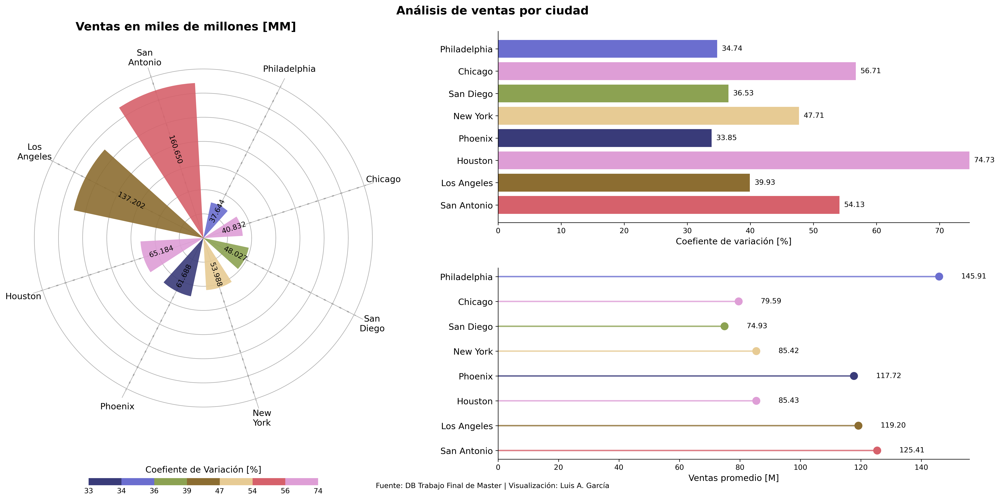

In [21]:
#%% Ventas totales por ciudad
fig = plt.figure(figsize=(20, 9.7),dpi=300) 
colores= circularBarPlot(x = TotalSalesbyCity["City"],
                         y = TotalSalesbyCity["TotalSales"]/ 1e9, # al dividir en / 1e9 convierto a MM (miles de millones)
                         z = TotalSalesbyCity["cv"],
                         title = "Ventas en miles de millones [MM]",
                         TextBar = "Coefiente de Variación [%]",
                         caption = "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García",
                         area = [0.0420165286130338, 0.164798032394585, 0.361090623699837, 0.709046996521238])

barplot(x = TotalSalesbyCity["City"],
        y = TotalSalesbyCity["cv"],
        colores = colores,
        area = [0.505227008396686, 0.549788393786976, 0.452222214342449, 0.378550293878684],
        nameax ="Coefiente de variación [%]")

lollipop_plot(x = TotalSalesbyCity["City"],
              y = TotalSalesbyCity["MeanSales"]/ 1e6, # convirto a Millones
              colores = colores,
              area = [0.505227008396686, 0.0817065874897521, 0.452222214342448, 0.378550293878684],
              nameax="Ventas promedio [M]")

plt.suptitle("Análisis de ventas por ciudad", fontsize=16,weight='bold')

En esta figura hay tres elementos que son los siguientes:

1. **Gráfico circular de barras:** Representa las ventas totales por ciudad, con el color de las barras indicando el coeficiente de variación (CV) asociado a cada ciudad.
2. **Gráfico de barras horizontal:** Muestra el coeficiente de variación (CV) de las ventas para cada ciudad.
3. **Gráfico Lollipop:** Representa el promedio de las ventas por ciudad.

**Interpretación de la información**
1. **Ventas totales y dispersión (gráfico circular de barras)**:
   
- Desde el 2010 hasta el 2012, las ciudades con mayores ventas son San Antonio y Los Ángeles, con cifras de 160.65 MM y 137.20 MM, respectivamente.
- San Antonio muestra un coeficiente de variación considerablemente alto (54.13%) en comparación con Los Ángeles (39.93%), lo que indica que las ventas en San Antonio están más dispersas en relación con su promedio. En contraste, en Los Ángeles, las ventas presentan una menor dispersión respecto a su promedio. Esto sugiere una mayor variabilidad en el comportamiento de las ventas en San Antonio en comparación con Los Ángeles.

2. **Variabilidad en las ventas (gráfico de barras horizontal):**

- Todas las ciudades tienen un coeficiente de variación mayor al 33%, lo que indica que las ventas en general son poco estables.
- **Houston** destaca como la ciudad con la mayor variabilidad (CV = 74.73%), mientras que Phoenix presenta la menor dispersión (CV = 33.85%).

3. **Ventas promedio (gráfico lollipop):**
- Aunque Philadelphia registró las ventas totales más bajas (37.64 MM) entre 2010 y 2012, destacó por tener el promedio de ventas más alto (145.91 M). Esto sugiere que, si bien vendió menos en general, sus ventas fueron significativamente altas en ciertas ocasiones. Además, Philadelphia presentó uno de los coeficientes de variación más bajos (CV = 34.74%), lo que indica una cierta estabilidad en sus ventas.
- **Phoenix**, por su parte, combina una baja dispersión (CV = 33.85%) con ventas totales moderadas (61.68 MM), ocupando el cuarto lugar en ventas promedio.


A modo de resumen tenemos que:

- San Antonio y Los Ángeles son las ciudades con el mayor volumen de ventas, aunque San Antonio presenta mayor variabilidad en sus ventas.
- Phoenix se destaca por tener las ventas más estables, aunque ocupa el cuarto lugar tanto en ventas totales como en ventas promedio durante el período de 2010 a 2012.
- Philadelphia es la segunda ciudad con mayor estabilidad en ventas promedio; sin embargo, registra el menor volumen de ventas totales durante el periodo analizado, posicionándose en último lugar.
- San Diego es la tercera ciudad con ventas más estables, y se ubica en el sexto lugar en términos de la ciudad con más ventas totales entre 2010 y 2012.

### Tiendas con mayores ventas por ciudad

Para ver las tiendas que más venden por ciudad, se hace uso del dataframe MaxSales. Este dataframe contiene, por ciudad, las tiendas que han tenido las ventas más altas durante el periodo 2010 al 2012.

Text(0.5, 0.025, 'Fuente: DB Trabajo Final de Master | Visualización: Luis A. García')

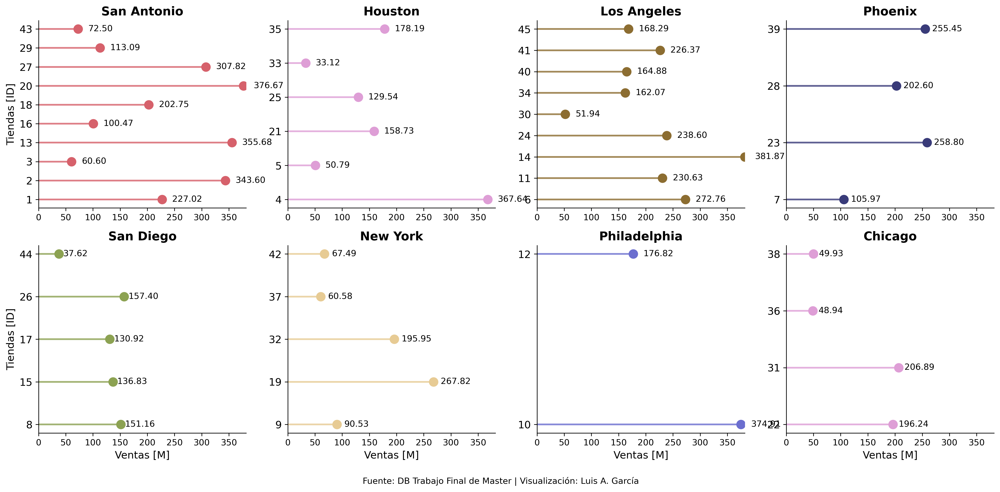

In [22]:
fig, axes = plt.subplots(2, 4, figsize=(20, 9.7),dpi=300)  

# Iterar sobre las ciudades y las áreas de los subgráficos
for i, city in enumerate(Citys):
    color = colores[city]
    MaxSalesbyStore = MaxSales.loc[(MaxSales['City'] == city), ['Weekly_Sales', 'Store']]
    x, y = MaxSalesbyStore['Store'], MaxSalesbyStore['Weekly_Sales'] / 1e6  # convertir a Millones
    
    # Determinar el 'ax' correspondiente en el grid de subgráficos
    ax = axes.flatten()[i]
    lollipop_plotByStoreInCity(x, y, color, area=ax , nameax='Ventas [M]',
                               nameay='Tiendas [ID]',
                               title =city,
                               city=city)
    ax.set_xlim(0, MaxSales['Weekly_Sales'].max()/ 1e6)
    
    if i < 4:
        ax.set_xlabel('')
    
    # Borrar nameay (etiqueta del eje Y) en los gráficos de la primera columna, excepto el primero
    if i % 4 != 0:
        ax.set_ylabel('')
#pie de página
fig.subplots_adjust(top=0.8) 
fig.text(0.5,
         0.025,
         "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García",
         fontsize=10, ha="center", va="baseline") 

La figura presentada ilustra las ventas máximas registradas por tienda en distintas ciudades. Cada subplot corresponde a una ciudad, mostrando las diferentes tiendas y sus ventas récord. A continuación, se detalla el comportamiento observado en cada una de ellas:

- **SAN ANTONIO:** En esta ciudad hay un total de 10 tiendas. Las ventas máximas entre las tiendas son variadas, con valores destacados en las tiendas 20, 27, 13 y 2, que registraron ventas entre 307 y 376 millones. Este rango amplio contribuye a un coeficiente de variación del 54.13%, indicando una alta desigualdad en las ventas máximas por tienda.
- **HOUSTON:** Con solo seis tiendas, las ventas máximas presentan rangos amplios, destacándose la tienda 4 con 367 millones. Esta disparidad explica el elevado coeficiente de variación del 74.73%, el más alto entre las ciudades analizadas. 
- **LOS ÁNGELES:**  Esta ciudad cuenta con nueve tiendas; algunas presentan ventas máximas similares. Sin embargo, la tienda 30 muestra las ventas máximas más bajas (51.94 millones), mientras que la tienda 14 lidera con 381.87 millones. Posiblemente esto sea la causa de por qué esta ciudad tiene un coeficiente de variación del 39.93%.
- **PHOENIX:** Cuenta con cuatro tiendas, tres de las cuales registran ventas máximas similares, mientras que una tienda reporta valores significativamente más bajos de 105 millones de ventas. Puede ser la causa por la cual el coeficiente de variación para esta ciudad sea del 33.85%. La consistencia en las ventas máximas sugiere un mercado relativamente equilibrado, aunque la tienda con ventas bajas podría requerir atención para identificar posibles mejoras.
- **SAN DIEGO:** Con cinco tiendas, San Diego muestra ventas máximas similares en cuatro de ellas, lo que contribuye a un coeficiente de variación moderado del 36.53%.
- **NEW YORK:** En Nueva York hay cinco tiendas con ventas máximas variadas. Las tiendas 42 y 37 reportan las ventas máximas más bajas (67.49 y 60.58 millones, respectivamente). El coeficiente de variación del 47.71% refleja esta disparidad.
- **PHILADELPHIA:** Esta ciudad tiene solo dos tiendas, con ventas máximas de 176.82 y 374.9 millones. La escasa cantidad de tiendas y las diferencias en las ventas explican el coeficiente de variación del 34.74%.
- **CHICAGO:** Hay cuatro tiendas. Las tiendas 31 y 22 presentan rangos de ventas máximas similares, al igual que las tiendas 38 y 36. Sin embargo, la desigualdad generalizada en los valores lleva a un coeficiente de variación elevado del 56.71%.

**A modo de conclusión se tiene que:**

- El análisis de las ventas máximas y el coeficiente de variación por ciudad resalta disparidades significativas en varias localidades. Se observa que las ciudades con mayor cantidad de tiendas, como San Antonio (10) y Los Ángeles (9), tienden a presentar coeficientes de variación muy diferentes (54.13% y 39.93%), debido a la mayor diversidad en los rangos de ventas. Por otro lado, las ciudades con menos tiendas, como Filadelfia (2) y Phoenix (4), muestran coeficientes de variación más moderados (34.74% y 33.85%, respectivamente), aunque en algunos casos, la disparidad entre pocas tiendas específicas puede influir de manera significativa en el CV.

- El número de tiendas no parece estar relacionado con el nivel de disparidad observado: una mayor cantidad de tiendas no necesariamente implica una mayor variabilidad en los rangos de ventas máximas. Sin embargo, las diferencias significativas entre los rangos de ventas récord sí incrementan el coeficiente de correlación.

### Impacto del combustible en las ventas max

Veamos si gráficamente se puede identificar una relación o un impacto del precio del combustible en las ventas máximas.

Text(0.5, 0.025, 'Fuente: DB Trabajo Final de Master | Visualización: Luis A. García')

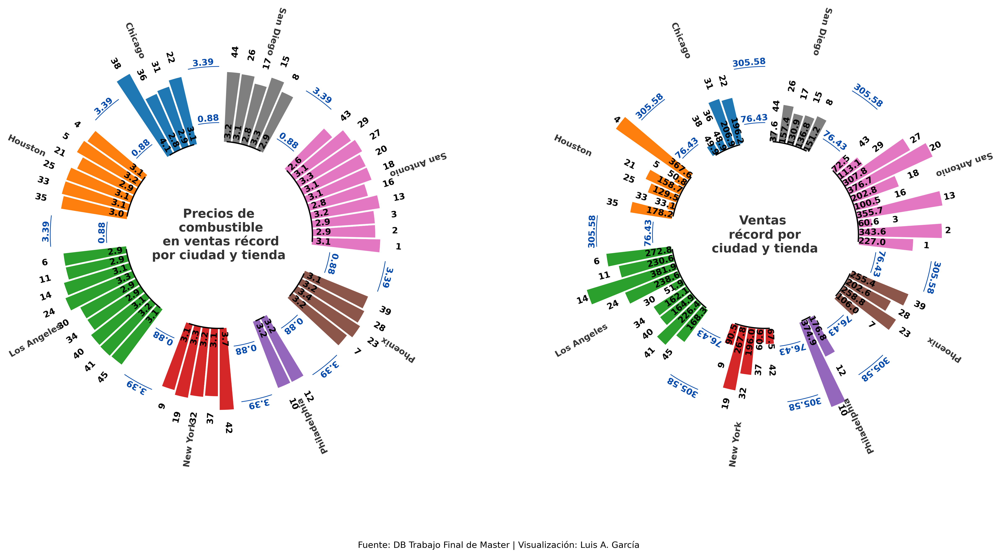

In [23]:
fig = plt.figure(figsize=(20, 9.7),dpi =300)

circularBarPlotWithGroups(VALUES = MaxSales["Fuel_Price"],
                          LABELS = MaxSales["Store"],
                          GROUP = MaxSales["City"],
                          area=[0.127290413782669, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Precios de\n combustible\n en ventas récord\npor ciudad y tienda",
                          labelcenterbar=MaxSales["Fuel_Price"].values,
                          PAD=3,
                          colors=None)


circularBarPlotWithGroups(VALUES = MaxSales['Weekly_Sales'] / 1e6, # convierto a millones
                          LABELS = MaxSales["Store"],
                          GROUP = MaxSales["City"],
                          area=[0.561662931653996, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Ventas \nrécord por\nciudad y tienda",
                          labelcenterbar=MaxSales['Weekly_Sales'] / 1e6,
                          PAD=3,
                          colors=None)
#pie de página
fig.subplots_adjust(top=0.8)
fig.text(0.5,
         0.025,
         "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García",
         fontsize=10, ha="center", va="baseline") 

En la figura se analiza la relación entre el precio del combustible y las ventas récord en cada tienda y ciudad. Los resultados gráficos sugieren que no existe un patrón claro que indique que el precio del combustible afecte directamente las ventas. Esto se debe a que el rango de precios del combustible es similar en la mayoría de las tiendas y ciudades, con algunas excepciones que no parecen influir significativamente en las ventas.
Esta observación será confirmada en la sección de correlaciones entre variables, donde se analizará más a fondo la relación entre estas variables.

### Impacto de la temperatura en las ventas max

Text(0.5, 0.025, 'Fuente: DB Trabajo Final de Master | Visualización: Luis A. García')

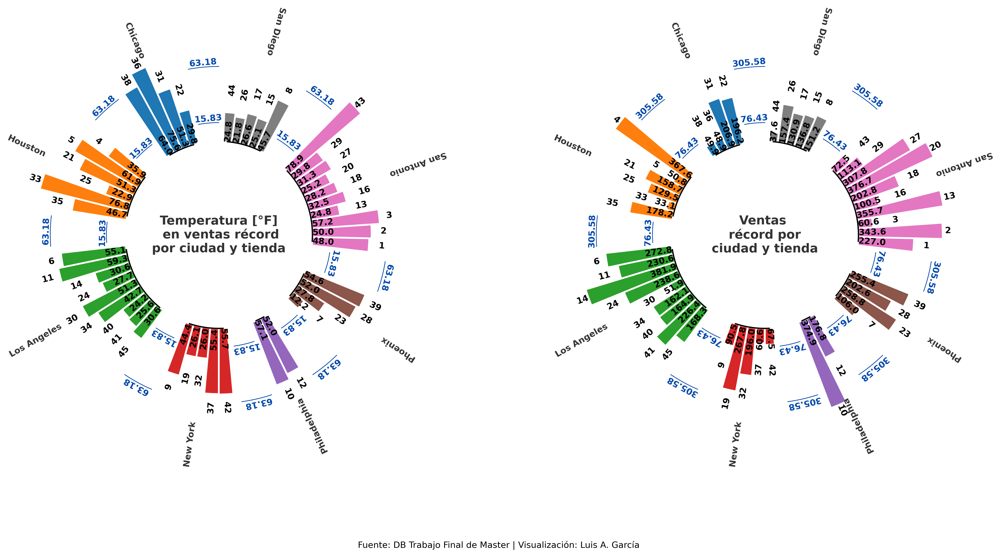

In [24]:
fig = plt.figure(figsize=(20, 9.7),dpi =300)

circularBarPlotWithGroups(VALUES = MaxSales["Temperature"],
                          LABELS = MaxSales["Store"],
                          GROUP = MaxSales["City"],
                          area=[0.127290413782669, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Temperatura [°F]\n en ventas récord\npor ciudad y tienda",
                          labelcenterbar=MaxSales["Temperature"].values,
                          PAD=3,
                          colors=None)


circularBarPlotWithGroups(VALUES = MaxSales['Weekly_Sales'] / 1e6, # convierto a millones
                          LABELS = MaxSales["Store"],
                          GROUP = MaxSales["City"],
                          area=[0.561662931653996, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Ventas \nrécord por\nciudad y tienda",
                          labelcenterbar=MaxSales['Weekly_Sales'] / 1e6,
                          PAD=3,
                          colors=None)
#pie de página
fig.subplots_adjust(top=0.8)
fig.text(0.5,
         0.025,
         "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García",
         fontsize=10, ha="center", va="baseline") 

Al analizar el impacto de las temperaturas en las ventas récord de cada tienda por ciudad, se identificó que la temperatura podría influir en el comportamiento de las ventas, sugiriendo la posible existencia de un patrón relacionado con las estaciones climáticas. Específicamente, se observó que algunas ventas máximas ocurren dentro de ciertos rangos de temperatura. Sin embargo, es fundamental considerar que las ventas también pueden estar influenciadas por otros factores, como periodos festivos, eventos específicos o la ubicación geográfica de las tiendas.

### Impacto de la tasa de desempleo en las ventas max

Text(0.5, 0.025, 'Fuente: DB Trabajo Final de Master | Visualización: Luis A. García')

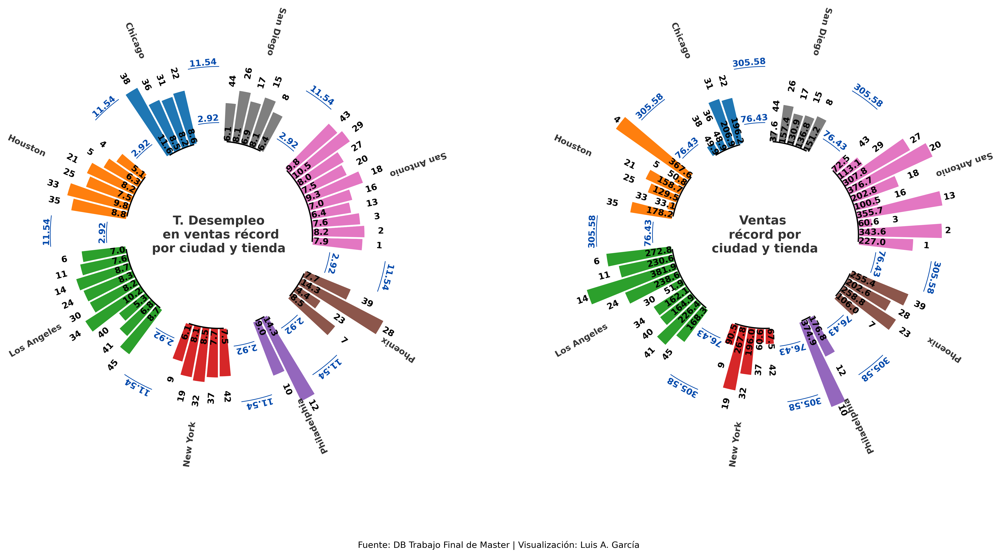

In [25]:
fig = plt.figure(figsize=(20, 9.7),dpi =300)

circularBarPlotWithGroups(VALUES = MaxSales["Unemployment"],
                          LABELS = MaxSales["Store"],
                          GROUP = MaxSales["City"],
                          area=[0.127290413782669, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="T. Desempleo\n en ventas récord\npor ciudad y tienda",
                          labelcenterbar=MaxSales["Unemployment"].values,
                          PAD=3,
                          colors=None)


circularBarPlotWithGroups(VALUES = MaxSales['Weekly_Sales'] / 1e6, # convierto a millones
                          LABELS = MaxSales["Store"],
                          GROUP = MaxSales["City"],
                          area=[0.561662931653996, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Ventas \nrécord por\nciudad y tienda",
                          labelcenterbar=MaxSales['Weekly_Sales'] / 1e6,
                          PAD=3,
                          colors=None)
#pie de página
fig.subplots_adjust(top=0.8)
fig.text(0.5,
         0.025,
         "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García",
         fontsize=10, ha="center", va="baseline")

La tasa de desempleo podría influir en las ventas de algunas localidades, aunque no se identifica un patrón claro en general. En Philadelphia, las mayores ventas récord se registraron con tasas de desempleo bajas, mientras que en New York ocurrieron durante periodos de desempleo relativamente alto. Por otro lado, en Chicago, las mayores ventas récord también se observaron con tasas de desempleo bajas. En las demás ciudades, no se evidenció un patrón consistente. Esto sugiere que, aunque la tasa de desempleo podría tener un impacto en las ventas en ciertas localidades, no existe una relación uniforme entre ambas variables.

Una vez analizadas las ventas totales y el comportamiento de algunas variables clave en relación con las ventas récord por ciudad y tienda, procederemos a examinar de manera general el comportamiento de las variables en función de la ciudad y la tienda. Para ello, nos apoyaremos en los estadísticos por grupos calculados en la variable group. A continuación, se presentan los principales aspectos que se analizarán.

1. **Ventas promedio y variabilidad: Análisis del coeficiente de variación.**
2. **Precio promedio del combustible y su variabilidad por tienda y ciudad.**
3. **Índice de Precios al Consumidor (IPC) y su variabilidad por tienda y ciudad.**
4. **Tasa de desempleo y su variabilidad por tienda y ciudad.**

### Ventas promedio y variabilidad 

Text(0.5, 0.025, 'Fuente: DB Trabajo Final de Master | Visualización: Luis A. García')

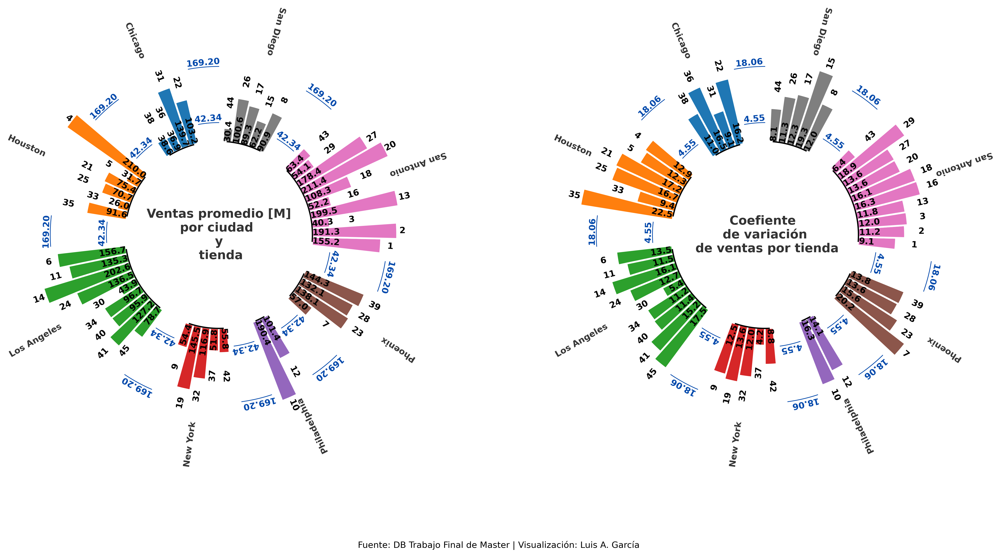

In [26]:
fig = plt.figure(figsize=(20, 9.7),dpi=300)

circularBarPlotWithGroups(VALUES = grupos['Weekly_Salesgroupby']['MeanValue']/1e6,# convierte a millones
                          LABELS =grupos['Weekly_Salesgroupby']['Store'],
                          GROUP = grupos['Weekly_Salesgroupby']['City'],
                          area=[0.127290413782669, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Ventas promedio [M]\npor ciudad \ny\n tienda",
                          labelcenterbar=grupos['Weekly_Salesgroupby']['MeanValue']/1e6,
                          PAD=3,
                          colors=None)

circularBarPlotWithGroups(VALUES = grupos['Weekly_Salesgroupby']['cv'],
                          LABELS = grupos['Weekly_Salesgroupby']['Store'],
                          GROUP = grupos['Weekly_Salesgroupby']['City'],
                          area=[0.561662931653996, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Coefiente \n de variación \n de ventas por tienda",
                          labelcenterbar=grupos['Weekly_Salesgroupby']['cv'].values,
                          PAD=3,
                          colors=None)
#pie de página
fig.subplots_adjust(top=0.8) 
fig.text(0.5,
         0.025,
         "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García",
         fontsize=10, ha="center", va="baseline") 

En la figura se muestran las ventas promedio para cada tienda y ciudad. Además, la segunda figura ilustra el coeficiente de variación de las ventas por tienda. Se puede observar que, en la ciudad de Phoenix, las ventas promedio son más estables en la mayoría de las tiendas, a excepción de la tienda 7. Asimismo, el coeficiente de variación en las tiendas de esta ciudad varía desde 13% hasta 20.2%, lo que sugiere que las ventas promedio  varían significativamente (57 - 144 M). Esto se evidencia en el coeficiente de variación general para la ciudad, donde se registró un mínimo de 33.85%.
En Philadelphia, con solo dos tiendas, se observa que, a pesar de las diferencias significativas en las ventas promedio entre ellas, ambas presentan coeficientes de variación entre 14% y 16.3%. Esto indica que, a pesar de la diferencia en ventas, la variabilidad en las ventas de ambas tiendas es muy similar.
En general, se observa que, aunque las tiendas presentan diferentes ventas promedio, los coeficientes de variación no son sensibles a estas diferencias. Es decir, que el hecho de que algunas tiendas vendan más que otras no implica necesariamente que tengan una mayor o menor variabilidad en sus ventas.


### Precio promedio del combustible y variabilidad

Text(0.5, 0.025, 'Fuente: DB Trabajo Final de Master | Visualización: Luis A. García')

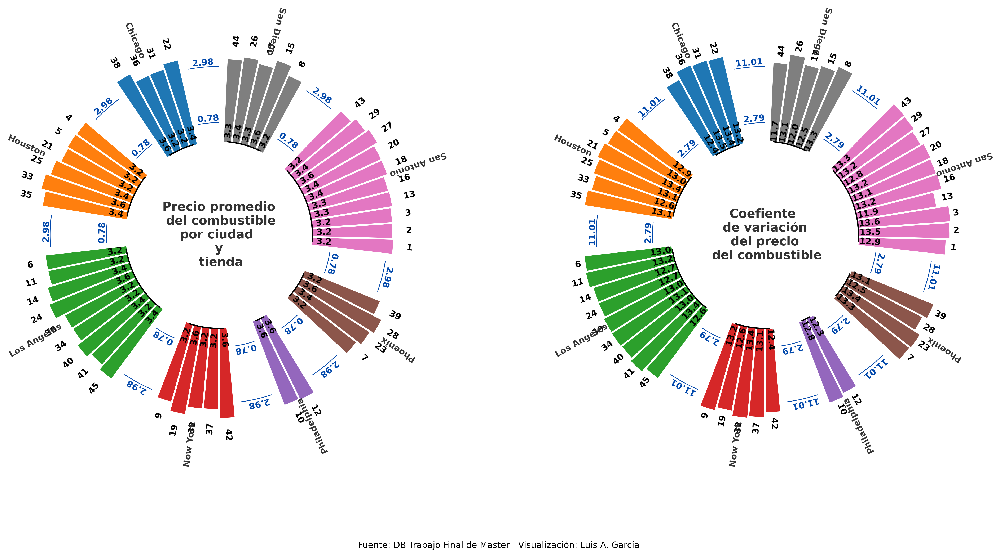

In [27]:
fig = plt.figure(figsize=(20, 9.7),dpi=300)

circularBarPlotWithGroups(VALUES = grupos['Fuel_Pricegroupby']['MeanValue'],
                          LABELS =grupos['Fuel_Pricegroupby']['Store'],
                          GROUP = grupos['Fuel_Pricegroupby']['City'],
                          area=[0.127290413782669, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Precio promedio\n del combustible\npor ciudad \ny\n tienda",
                          labelcenterbar=grupos['Fuel_Pricegroupby']['MeanValue'],
                          PAD=3,
                          colors=None)

circularBarPlotWithGroups(VALUES = grupos['Fuel_Pricegroupby']['cv'],
                          LABELS = grupos['Fuel_Pricegroupby']['Store'],
                          GROUP = grupos['Fuel_Pricegroupby']['City'],
                          area=[0.561662931653996, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Coefiente \n de variación \n del precio \n del combustible",
                          labelcenterbar=grupos['Fuel_Pricegroupby']['cv'].values,
                          PAD=3,
                          colors=None)
#pie de página
fig.subplots_adjust(top=0.8) 
fig.text(0.5,
         0.025,
         "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García",
         fontsize=10, ha="center", va="baseline") 

El precio promedio del combustible por tienda muestra una notable uniformidad, con solo ligeras variaciones entre ellas. Esto se refleja también en los coeficientes de variación, que mantienen valores similares para cada tienda en cada ciudad.

### CPI promedio y variabilidad

Text(0.5, 0.025, 'Fuente: DB Trabajo Final de Master | Visualización: Luis A. García')

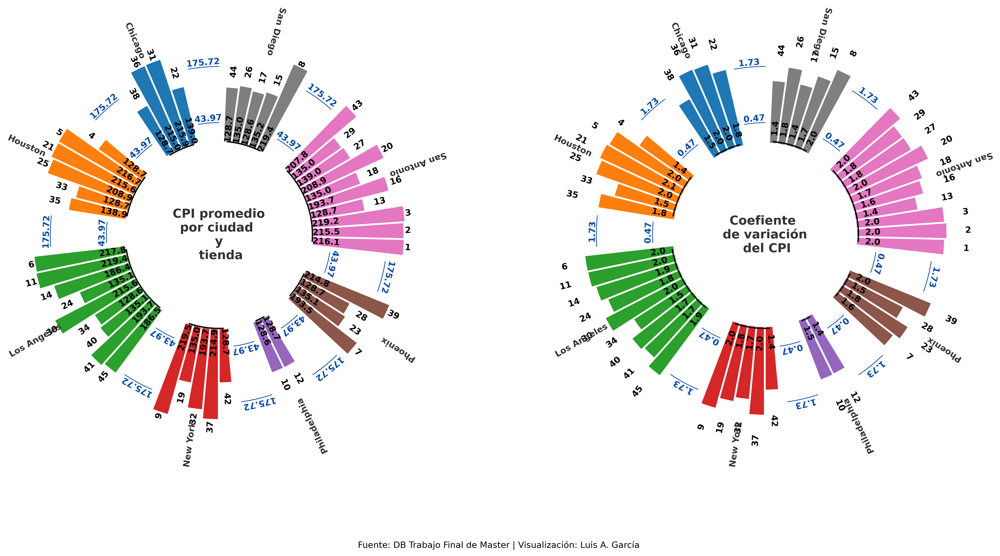

In [28]:
fig = plt.figure(figsize=(20, 9.7),dpi =300)

circularBarPlotWithGroups(VALUES = grupos['CPIgroupby']['MeanValue'],
                          LABELS =grupos['CPIgroupby']['Store'],
                          GROUP = grupos['CPIgroupby']['City'],
                          area=[0.127290413782669, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="CPI promedio\npor ciudad \ny\n tienda",
                          labelcenterbar=grupos['CPIgroupby']['MeanValue'],
                          PAD=3,
                          colors=None)

circularBarPlotWithGroups(VALUES = grupos['CPIgroupby']['cv'],
                          LABELS = grupos['CPIgroupby']['Store'],
                          GROUP = grupos['CPIgroupby']['City'],
                          area=[0.561662931653996, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Coefiente \n de variación \n del CPI",
                          labelcenterbar=grupos['CPIgroupby']['cv'].values,
                          PAD=3,
                          colors=None)
#pie de página
fig.subplots_adjust(top=0.8) 
fig.text(0.5,
         0.025,
         "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García",
         fontsize=10, ha="center", va="baseline") 

El Índice de Precio al Consumidor (CPI) muestra que, en todas las ciudades, las tiendas presentan una variación comprendida entre el 1.4% y el 2%. La única excepción es Philadelphia, donde el CPI no supera un coeficiente de variación del 1.5%. En el resto de las ciudades, las tiendas exhiben diferentes coeficientes de variación para el CPI. 

### Tasa de desempleo promedio y variabilidad

Text(0.5, 0.025, 'Fuente: DB Trabajo Final de Master | Visualización: Luis A. García')

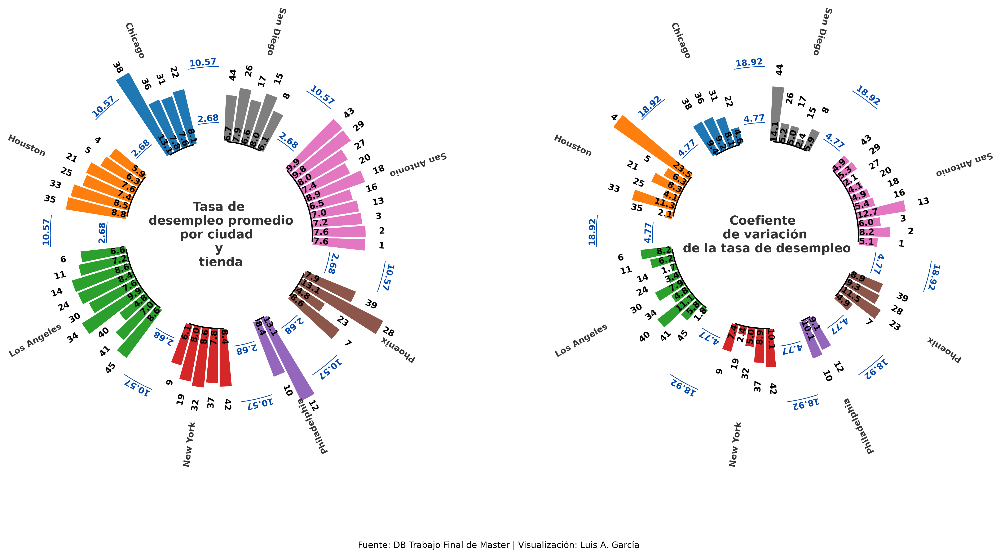

In [29]:
fig = plt.figure(figsize=(20, 9.7),dpi =300)

circularBarPlotWithGroups(VALUES = grupos['Unemploymentgroupby']['MeanValue'],
                          LABELS =grupos['Unemploymentgroupby']['Store'],
                          GROUP = grupos['Unemploymentgroupby']['City'],
                          area=[0.127290413782669, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Tasa de\n desempleo promedio\npor ciudad \ny\n tienda",
                          labelcenterbar=grupos['Unemploymentgroupby']['MeanValue'],
                          PAD=3,
                          colors=None)

circularBarPlotWithGroups(VALUES = grupos['Unemploymentgroupby']['cv'],
                          LABELS = grupos['Unemploymentgroupby']['Store'],
                          GROUP = grupos['Unemploymentgroupby']['City'],
                          area=[0.561662931653996, 0.231271188318451, 0.300047042248194, 0.614328283007125],
                          description="Coefiente \n de variación \n de la tasa de desempleo",
                          labelcenterbar=grupos['Unemploymentgroupby']['cv'].values,
                          PAD=3,
                          colors=None)
#pie de página
fig.subplots_adjust(top=0.8) 
fig.text(0.5,
         0.025,
         "Fuente: DB Trabajo Final de Master | Visualización: Luis A. García",
         fontsize=10, ha="center", va="baseline") 

Al analizar la tasa de desempleo, se observó que la ciudad donde las tiendas reportan la menor tasa de desempleo promedio es Houston. Sin embargo, de manera general, en todas las ciudades y tiendas se registran valores promedio diferentes para la tasa de desempleo, que oscilan entre el 5.9 y el 13.1. Existen ciudades donde estos valores promedio son más estables, como es el caso de San Diego, San Antonio, New York, Los Ángeles y Houston. Por otro lado, en Chicago, Philadelphia y Phoenix, se han registrado valores promedio de 13.1 solo en una de sus tiendas.
Sin embargo, los coeficientes de variación indican que Houston es la ciudad donde estos índices de desempleo han experimentado una mayor variabilidad, con un coeficiente de 23.5% registrado en la tienda 4. Le siguen San Diego con 14.1% y San Antonio con 12.7%.

**Dado que el promedio es sensible a valores atípicos, procedemos a ver cómo son las distribuciones de estas variables, identificando así valores atípicos, rangos de concentración y sesgos.**

## Comportamiento general de las variables

Veamos cómo están las distribuciones de las variables **'Weekly_Sales'**, **'Holiday_Flag'**, **'Temperature'**, **'Fuel_Price'**, **'CPI'**,**'Unemployment'**.

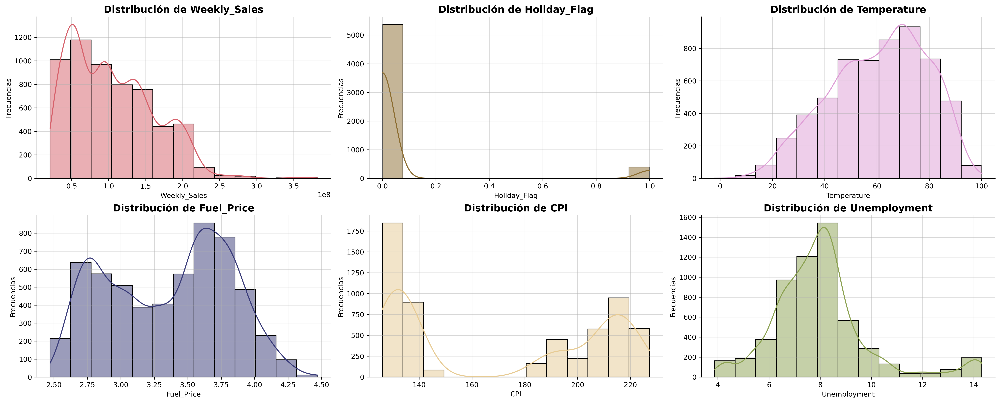

In [30]:
columnas = ['Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI','Unemployment']

fig, axes = plt.subplots(2, 3, figsize=(20, 8), constrained_layout=True,dpi=300)  
axes = axes.flatten()
# Crear un histograma para cada columna
for ax, column, color in zip(axes, columnas, list(colores.values())[:6]):
    n = len(WalmartSales[column])
    numBins = int(1 + np.log2(n))
    # Calcular el histograma manualmente para obtener frecuencias absolutas
    frequencies, bin_edges = np.histogram(WalmartSales[column], bins=numBins)
    bin_width = bin_edges[1] - bin_edges[0]  # Ancho de cada bin
    
    # Dibujar el histograma con un color único
    sns.histplot(WalmartSales[column], bins=numBins, kde=True, ax=ax, color=color)
    
    # Configurar detalles del gráfico
    ax.set_title(f'Distribución de {column}', fontsize=14, weight='bold')
    ax.set_ylabel('Frecuencias')
    ax.grid(True, alpha=0.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

En la figura se observa que la variable Temperatura es la que más se aproxima a una distribución normal. Los rangos de temperatura comprendidos entre 60 y 80 presentan la mayor concentración de valores en torno a la media. Por otro lado, la variable objetivo (Weekly_Sales) muestra una distribución sesgada hacia la derecha, lo que sugiere la presencia de valores atípicos. Esta alta dispersión indica que podría ser útil aplicar una transformación logarítmica para estabilizar la varianza y reducir el sesgo.
La distribución de la variable Holiday_Flag refleja que la mayoría de las semanas no son festivas, mientras que solo una pequeña proporción corresponde a semanas festivas. Al tratarse de una variable binaria, este desbalance podría ser relevante para los modelos.
En cuanto a la variable Fuel_Price, su distribución es bimodal, con dos picos claros que representan los rangos de precios más frecuentes. Sin embargo, la dispersión no es muy pronunciada.
Por su parte, la variable CPI presenta una distribución multimodal, evidenciando la existencia de diferentes subgrupos con rangos de precios frecuentes que podrían estar asociados a factores específicos como la región o localidad.
Finalmente, la variable Unemployment muestra un ligero sesgo hacia la derecha, con los valores más frecuentes situados entre 6 y 8. Aunque la dispersión es considerable, el sesgo no es extremo. Sería recomendable verificar si esta variable cumple con la normalidad de los residuos al incluirla en un modelo.

**De forma general se concluye que:**

- Las variables como Fuel_price y CPI muestran sesgos o multimodalidad, lo que podría requerir transformaciones o segmentaciones para modelarlas de manera adecuada.
- Temperature y posiblemente Unemployment parecen tener distribuciones más regulares, lo que las hace aptas para modelado lineal directo.
- Holiday_Flag no necesita tratamiento adicional, pero su desbalance debe considerarse en los análisis.

**Verifiquemos el sesgo de las variables.**

### Skewness

In [31]:
# calculemos el sesgo Skewness
for i in WalmartSales.select_dtypes(['int','float']).columns:
    print(f"Column: {i}, Skewness: {WalmartSales[i].skew():.6f}")

Column: Store, Skewness: -0.003557
Column: Weekly_Sales, Skewness: 0.657795
Column: Holiday_Flag, Skewness: 3.421459
Column: Temperature, Skewness: -0.330335
Column: Fuel_Price, Skewness: -0.101333
Column: CPI, Skewness: 0.067890
Column: Unemployment, Skewness: 1.179785
Column: Holiday_Events, Skewness: 3.421459
Column: Day, Skewness: 0.013695
Column: Weekday, Skewness: 0.000000
Column: Month, Skewness: 0.030156
Column: Year, Skewness: 0.058713
Column: quarter, Skewness: -0.000331


- Se puede observar que variables como **Store**, **Fuel_Price**, **CPI**, **Day**, **Weekday**, **Month**, **Year** y **Quarter** presentan distribuciones simétricas, lo que sugiere una dispersión uniforme alrededor de la media.

- Variables como **Weekly_Sales** y **Unemployment** tienen un sesgo positivo moderado, indicando la presencia de valores más altos en los extremos.
- **Holiday_Flag** y **Holiday_Events** presentan sesgos positivos fuertes, debido a su naturaleza binaria.
- **Temperature** muestra un sesgo negativo leve, con una mayor concentración hacia valores bajos.

### Box plot

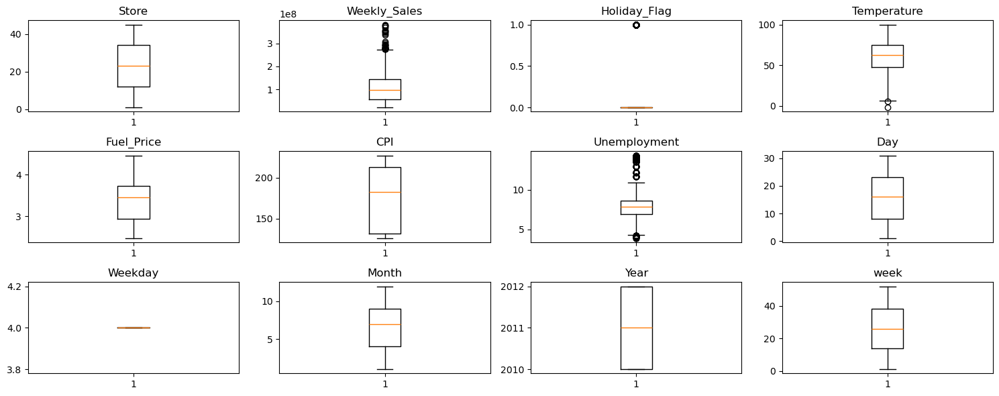

In [32]:
WalmartSales =WalmartSales.drop(columns=['Holiday_Events'],axis=1)
fig, axs = plt.subplots(3, 4, figsize=(15, 6))
for i, col in enumerate(WalmartSales.columns):
    if i < len(axs.flatten()):  
        axs[i // 4, i % 4].boxplot(WalmartSales[col])
        axs[i // 4, i % 4].set_title(col)
plt.tight_layout()
plt.show()

En el diagrama de cajas y bigotes (Boxplot) se evidencia lo siguiente :

- **Weekly_Sales (Variable objetivo):** La distribución de las ventas semanales presenta valores atípicos significativos en el extremo derecho, lo que indica la presencia de outliers. Esto podría estar relacionado con eventos excepcionales como promociones o picos estacionales. Además, la baja variabilidad alrededor de la mediana sugiere una tendencia hacia valores más consistentes en la mayoría de las semanas.
- **Temperature:** La variable de temperatura muestra algunos valores atípicos hacia el extremo inferior, lo que indica temperaturas inusualmente bajas. 
- **Fuel_Price:** El precio del combustible muestra una alta dispersión alrededor de la mediana, evidenciada por un cuerpo alargado en el Boxplot. Esto indica una volatilidad significativa en los precios, posiblemente influenciada por fluctuaciones económicas o eventos externos.
- **CPI:** El índice de precios al consumidor (CPI) también presenta alta variabilidad, reflejada en su dispersión en torno a la mediana. Esto podría sugerir cambios recurrentes en la dinámica de los precios.
- **Unemployment:** La tasa de desempleo incluye valores atípicos en ambos extremos, lo que sugiere la existencia de situaciones extremas en ciertos periodos o regiones. Sin embargo, la distribución tiende hacia la derecha, indicando que las tasas más altas son más frecuentes. A pesar de ello, los datos muestran una dispersión limitada en torno a la mediana, sugiriendo estabilidad en la mayoría de los casos.


### Correlaciones

Conocidas las distribuciones de los datos, veamos cómo  están correlacionadas las variables.
Eliminemos la variable Weekday, ya que nos muestra una sección en blanco. 

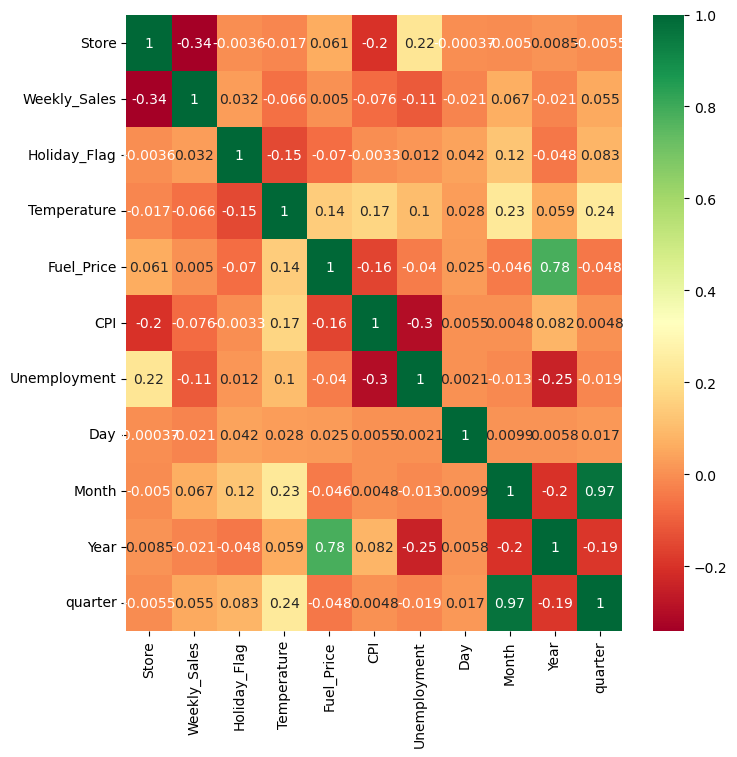

In [33]:
WalmartSales = WalmartSales.drop(columns=['Weekday'],axis=1)
plt.figure(figsize=(8,8))
sns.heatmap(WalmartSales.select_dtypes(['float','int']).corr(),annot=True,cmap='RdYlGn')
plt.show()

Se observa que algunas variables presentan una alta correlación entre sí, lo cual deberá ser abordado según los resultados del modelo, ya que podría generar el incumplimiento de algunos supuestos de la regresión lineal. Además, la variable más correlacionada con la variable objetivo es Store. No obstante, mediante un análisis de importancia de características, podremos identificar cuáles variables son consideradas más relevantes por el modelo para realizar predicciones.

# Entrenamiento de modelo simple

Vamos a entrenar un modelo de regresión lineal utilizando la librería API y analizar qué tan bien puede explicar la variabilidad de las ventas semanales.

In [34]:
df = WalmartSales.copy()
df = df.drop(columns=['City'])
def normalizar_datos (target,df):
    X = df.drop(columns=[target],axis=1)
    y = df[target]
    escalador = preprocessing.MinMaxScaler()
    X_nor = pd.DataFrame(escalador.fit_transform(X),
                         columns = X.columns,
                         index=X.index)
    dfnor = pd.concat([y,X_nor],axis=1)
    return dfnor
# normaliza
df1nor = normalizar_datos (target='Weekly_Sales',
                          df = df)
independientes = df1nor.drop(columns=['Weekly_Sales'],axis=1) 
objetivo = df1nor['Weekly_Sales'] 
# Divide en entrenamiento y prueba
X_train, X_test, Y_train, Y_test = train_test_split(independientes,
                                                    objetivo,
                                                    test_size=0.2,
                                                    random_state=42)
Train_xy = pd.concat([X_train,Y_train],axis=1)
API1 = api.ols(formula='{} ~ {}'.format('Weekly_Sales',' + '.join(i for i in X_train.columns)), data=Train_xy).fit()
summary_text = API1.summary().as_text()
first_summary = "\n".join(summary_text.splitlines()[:12])  
print(first_summary)

                            OLS Regression Results                            
Dep. Variable:           Weekly_Sales   R-squared:                       0.151
Model:                            OLS   Adj. R-squared:                  0.149
Method:                 Least Squares   F-statistic:                     74.59
Date:                Mon, 13 Jan 2025   Prob (F-statistic):          6.13e-155
Time:                        19:23:02   Log-Likelihood:                -88424.
No. Observations:                4610   AIC:                         1.769e+05
Df Residuals:                    4598   BIC:                         1.769e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         


El modelo explica el 15% de la variabilidad de los datos. Con base en esto, es probable que modelos más avanzados, como Random Forest, puedan capturar más del 70% de la variabilidad en las ventas semanales.

# Resultados y conclusiones

1. **Volumen y estabilidad de ventas por ciudad**
   
   - San Antonio y Los Ángeles destacan como las ciudades con el mayor volumen de ventas; sin embargo, San Antonio presenta una alta variabilidad en comparación con los Ángeles.
   - Filadelfia, aunque es la segunda ciudad con mayor estabilidad en las ventas totales, registra el menor volumen total de ventas durante el periodo analizado, ubicándose en último lugar.
   - San Diego ocupa el tercer lugar en términos de estabilidad en ventas y el sexto lugar en volumen total entre 2010 y 2012.
2. **Distribución de tiendas y su impacto en la variabilidad de ventas**
   
   - San Antonio lidera con 10 tiendas, seguido por Los Ángeles con 9.
   - Ciudades con mayor cantidad de tiendas, como San Antonio (10) y Los Ángeles (9), tienden a presentar coeficientes de variación muy diferentes (54.13% y 39.93%), debido a la mayor diversidad en los rangos de ventas. Por otro lado, las ciudades con menos tiendas, como Filadelfia (2) y Phoenix (4), muestran coeficientes de variación más moderados (34.74% y 33.85%, respectivamente), aunque en algunos casos, la disparidad entre pocas tiendas específicas puede influir de manera significativa en el CV.
   - El número de tiendas no parece estar relacionado con el nivel de disparidad observado: una mayor cantidad de tiendas no necesariamente implica una mayor variabilidad en los rangos de ventas máximas. Sin embargo, las diferencias significativas entre los rangos de ventas récord sí incrementan el coeficiente de correlación.
3. **Análisis de factores externos y su relación con las ventas**
   
   - Los resultados gráficos indican que el precio del combustible no afecta de manera significativa las ventas. El rango de precios del combustible es similar en la mayoría de las tiendas y ciudades, con algunas excepciones que no muestran un impacto relevante.
   - Al analizar la tasa de desempleo durante los momentos de ventas récord, se observa que esta variable puede influir en algunas localidades, aunque no se identifica un patrón claro.
   - Houston es la ciudad donde estos índices de desempleo han experimentado una mayor variabilidad, con un coeficiente de 23.8% registrado en la tienda 4. Le siguen San Diego con 14.1% y San Antonio con 12.7%.
4. **Patrones de variación en ventas**

   - Aunque las tiendas presentan diferentes ventas promedio, los coeficientes de variación no son sensibles a estas diferencias. Es decir, que el hecho de que algunas tiendas vendan más que otras no implica necesariamente que tengan una mayor o menor variabilidad en sus ventas.
   - La variable más correlacionada con la variable objetivo es Store.
5. **Resultados del modelo de regresión lineal simple**

   - El modelo explica el 15% de la variabilidad de los datos. Con base en esto, es probable que modelos más avanzados, como Random Forest, puedan capturar más del 70% de la variabilidad en las ventas semanales.


**Conclusiones basadas en los resultados**

Las preguntas de investigación planteadas al inicio del problema pueden responderse de la siguiente manera:

1. ¿Qué características permiten realizar predicciones con una mayor probabilidad de éxito?

   - **R//:** La variable Store fue la que mostró la mayor correlación con la variable objetivo (-0.34). Esto sugiere que los modelos a entrenar deberían considerar enfoques adicionales, como el análisis de componentes principales (PCA), el análisis de factores de inflación de la varianza (VIF) y la selección de características mediante RFE (Recursive Feature Elimination).
2. ¿Existen patrones que puedan ayudar a predecir los ingresos futuros de cada una de las tiendas?

   - **R//:** Sí, se identificaron algunas variables altamente correlacionadas, lo que sugiere que los modelos a entrenar podrían generar resultados satisfactorios al aprovechar estos patrones.
3. ¿Es viable implementar un modelo de regresión lineal para realizar estas predicciones?

   - **R//:** Sí, se identificaron algunas variables altamente correlacionadas, lo que sugiere que los modelos a entrenar podrían generar resultados satisfactorios al aprovechar estos patrones.